# Ski Resort Project
## The results' notebook for case 3: Hoch-Ybrigh
## setup 1: 7500 experiments (1500 scenarios & 5 Policies)

This notebook is used for the visualization of the ema_Ski_Resort project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLR Framework

## Step 5: Model deployment

### Load the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\CHrandomness_6'
rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig_v3_2\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\CHrandomness_6'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\CHrandomness_6'

fh = os.path.join(rootOut, '7500_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig_v3_2\CHrandomness_6\7500_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(outcomes.keys()))

(7500, 12)
['y', 'y1', 'y3', 'y4', 'y5', 'y6']


## Step 6: Visualization of the EMA_Workbench Results

### Visualization with ema-workbench - part1

[MainProcess/DEBUG] generating pairwise scatter plot


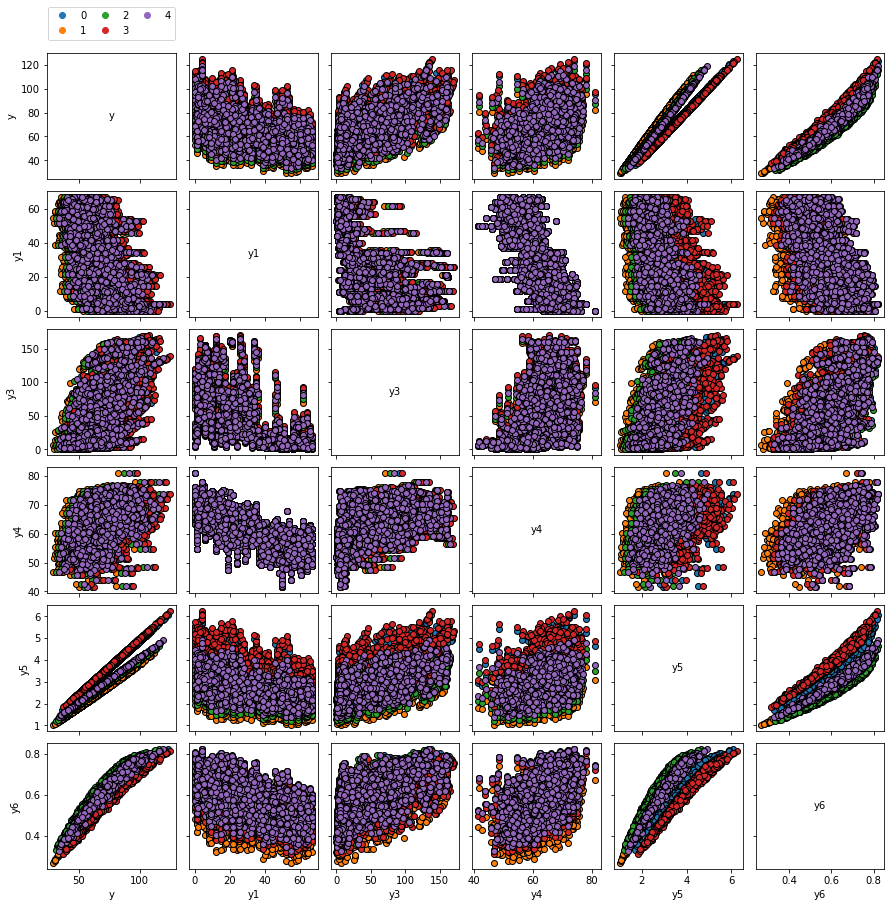

In [9]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
plt.show()

### Assign the address of outputs folders

In [7]:
import tarfile

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '7500_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '7500_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '7500_runs')

In [8]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'y.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'y1.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'y3.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'y4.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'y5.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'y6.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]

Make a database from the outputs of ema by concatinating the individual outs and experiments

In [10]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_87,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6
0,1.090964,1002.396567,3.992380,-1.472574,2.649151,0.960196,0.769909,223.983843,85.315956,0,0,UZHModel,72.838105,11,68.241519,152.354006,43.943661,39.362214,149.741551,58.764819,132.076174,40.700123,84.115792,116.685634,81.987345,122.716958,95.437841,96.603389,43.122530,129.534112,48.735837,114.949691,76.330238,35.616140,...,32.376621,34.254703,41.922935,93.212090,45.683831,7.626488,101.409326,120.199929,123.784621,89.141643,63.075690,80.004781,37.250633,53.527790,42.839965,18.437982,25.224632,98.920707,60.301582,72.647183,99.587509,71.880930,12.098328,62.967835,51.535592,43.853119,135.574705,66.340321,58.039990,81.318606,101.867247,68.849492,3.520424,0.621845
1,1.370185,969.066546,5.819858,-1.679446,2.880164,0.714967,2.838488,223.983843,85.315956,1,0,UZHModel,72.822244,58,135.894622,124.477171,116.732863,103.738869,147.321830,105.140873,114.533810,154.875593,159.799485,110.205853,119.412902,143.359803,116.470526,142.816282,111.615478,106.130415,120.041892,99.034103,106.640696,16.364886,...,14.621099,48.166300,100.457375,27.727804,37.280055,7.043722,31.207519,113.268296,35.074896,16.421631,39.000894,14.766735,16.823401,9.693155,46.697386,2.949722,9.149097,57.232851,14.709499,20.881328,2.879181,10.734167,5.225288,20.261640,13.176977,2.177880,13.820059,15.282442,26.365161,7.432902,10.710549,53.980763,3.531186,0.582179
2,1.507452,943.103856,5.087858,-1.510243,1.081796,0.796302,2.229923,223.983843,85.315956,2,0,UZHModel,76.725551,31,111.071561,128.726173,34.491416,121.404979,175.629342,97.858229,18.263237,121.770922,156.834103,87.832452,152.554536,110.256808,141.322112,122.142665,132.893066,81.683035,116.970517,113.237546,140.453038,127.918673,...,84.756151,90.088061,9.365542,28.133279,31.351904,23.155643,74.969515,10.877972,125.982018,110.992534,41.792390,60.048215,4.666542,29.367163,6.327242,32.166070,55.012138,38.808112,11.700353,24.980418,27.305987,142.871121,17.881424,88.850684,27.234107,7.839717,44.236041,46.352162,17.302677,26.372081,42.841483,62.817542,3.703898,0.605334
3,1.329431,953.995844,5.036604,-1.404387,0.562516,0.590494,2.966876,223.983843,85.315956,3,0,UZHModel,91.453445,54,72.585191,73.563878,72.934100,96.980380,126.637207,89.171129,82.930864,110.922554,153.481783,105.803596,145.458265,143.105510,142.957947,159.753019,103.081191,73.797421,122.069442,113.068069,113.422009,110.381793,...,35.435681,111.982269,118.549793,23.452674,135.893671,20.003630,45.650168,143.868175,54.941501,34.440743,45.677220,20.324814,72.987792,89.198525,23.889134,23.966952,22.354068,99.382813,20.983165,24.040573,64.147347,17.924373,13.425076,21.907920,29.107501,86.673731,35.785796,47.016829,14.367777,43.677570,3.870770,64.272797,4.449831,0.674443
4,1.242618,945.884982,3.569642,-1.567881,2.516334,0.039717,2.836422,223.983843,85.315956,4,0,UZHModel,49.776152,37,67.518582,40.758163,124.294858,102.800063,85.027984,160.863555,118.375416,156.802919,135.771059,116.676550,128.317050,115.734078,53.372153,123.919009,121.788142,105.341939,111.013229,91.521079,39.522851,62.896432,...,7.550813,19.678473,31.515175,2.706311,53.590318,5.175463,54.720733,7.614656,33.997408,8.408330,7.076448,13.050718,16.065489,4.474608,7.226280,40.556950,23.135999,2.837794,8.715405,15.189756,6.500915,4.391567,39.380385,8.535437,11.795047,5.043087,11.895903,43.889773,9.494033,7.580457,8.914393,54.471441,2.377881,0.434501


In [11]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values

In [12]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [13]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [14]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

7500
7500
7500
7500


In [15]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [16]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [17]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(7500, 119, 2)
(7500, 119, 2)
(7500, 119, 2)
(7500, 119, 2)


#### Check the header of outputs

In [18]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_Ver2_85_22
Money_sc_Ver2_85_22
ArtSnowPossibility_
isOverSnow_sc_Ver2_85_22


In [19]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
#matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
 #                            if 'RCP26' in emptyMatrixArt[i][0,1] or \
  #                           '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
#matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
 #                            if 'RCP45' in emptyMatrixArt[i][0,1] or \
  #                          '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
#matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
 #                            if 'RCP85' in emptyMatrixArt[i][0,1] or \
  #                          '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [20]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
#print(matrix_Art26.shape)
#print(matrix_Art45.shape)
#print(matrix_Art85.shape)
#print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
7500
1785000
<U47
str1504
#########
(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
7500
#########
(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
7500
#########
#########
(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
7500


In [21]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
#print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [22]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

#q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
#q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
#q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
#q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
#q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [23]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

#print(q10_years_Art[0])
#print(q25_years_Art[0])
#print(q50_years_Art[0])
#print(q75_years_Art[0])
#print(q90_years_Art[0])
#print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[28.24443901]
[47.4771677]
[70.86739146]
[94.10783528]
[114.4621592]
(118, 1)
[1.14]
[1.94]
[2.99]
[4.16]
[5.16]
(118, 1)
[34.15795626]
[56.62463303]
[84.72778106]
[100.]
[100.]
(118, 1)


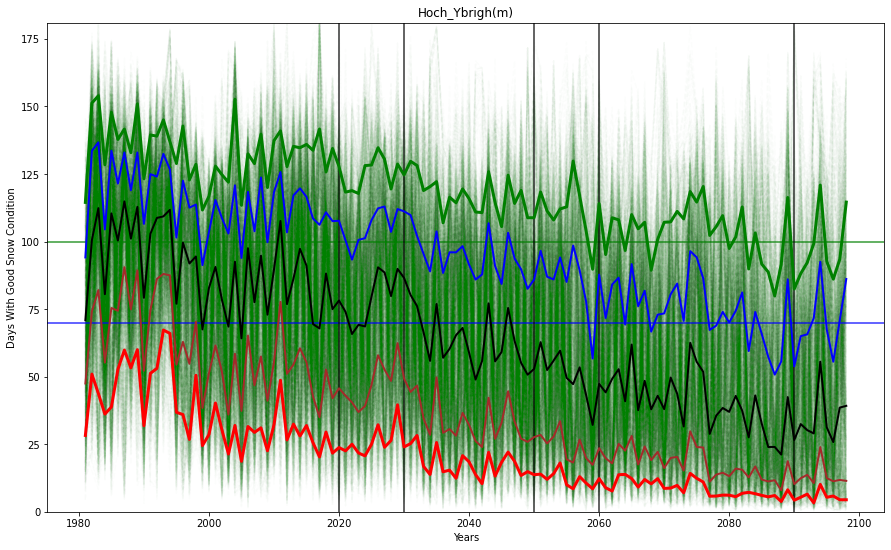

In [24]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 3, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 2, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 2, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 2, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 3, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

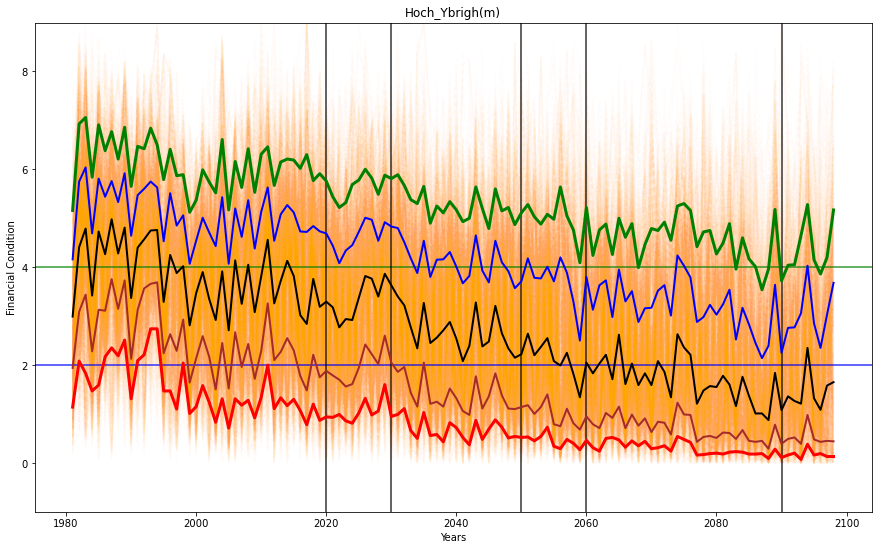

In [25]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 3, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 2, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 2, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 2, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 3, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

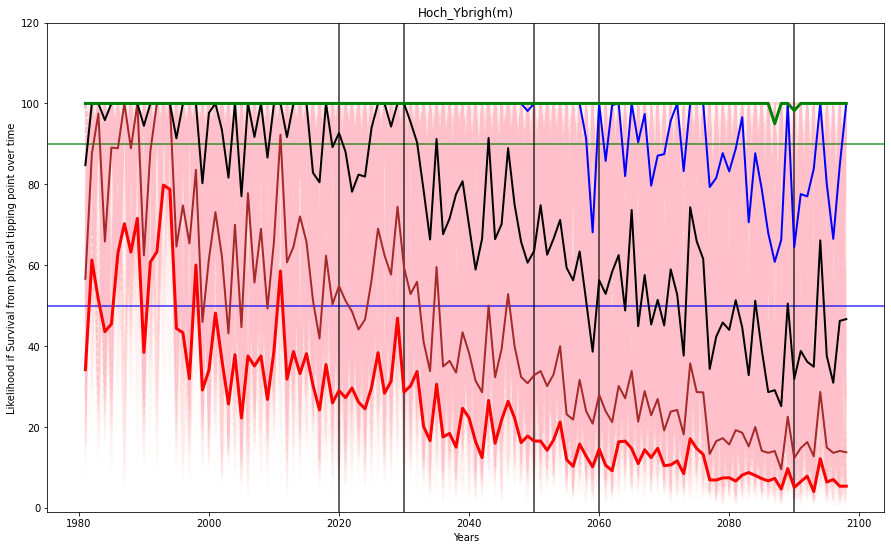

In [26]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 3, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 2, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 2, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 2, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 3, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood if Survival from physical tipping point over time')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

In [27]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['y'] < 70
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 4403 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.13546666666666668, coverage: 0.23075176016352486, density: 1.0 restricted_dimensions: 4


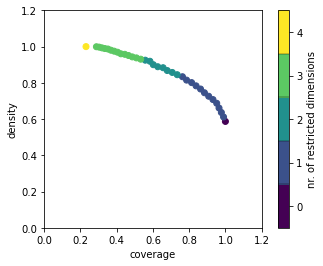

In [38]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

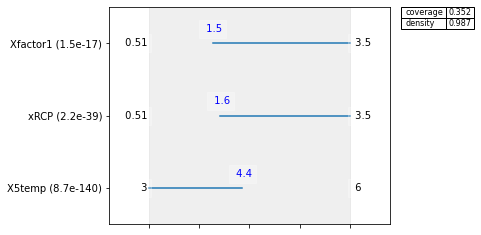

In [39]:
# Saeed : explore the inspect effect
box1.inspect(30, style='graph')
plt.show()

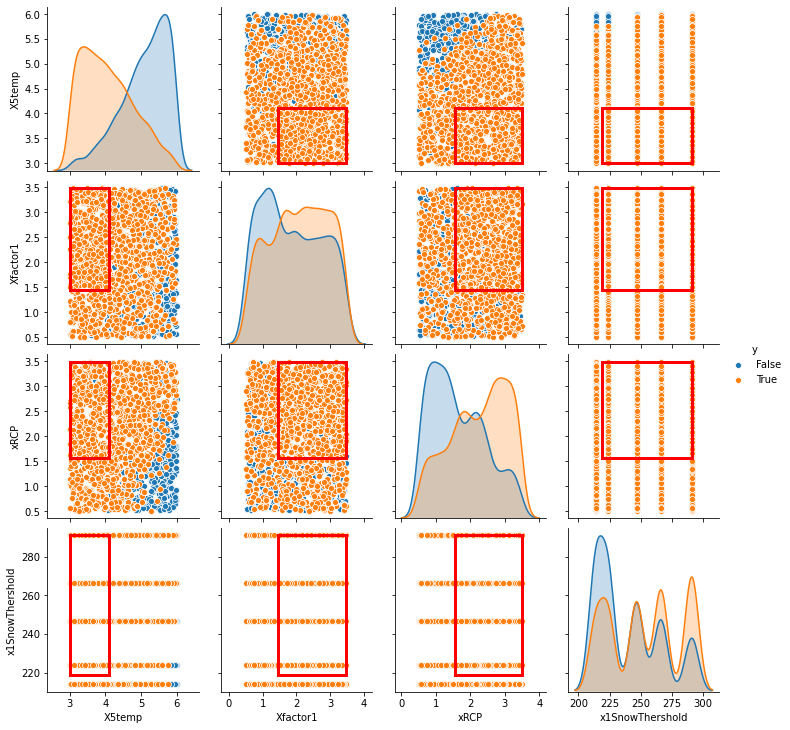

In [65]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(35)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays.svg'), format='svg', dpi=600)

### likelihood of survival analysis

In [66]:
x = experiments
y = outcomes['y6'] < 0.6
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 4408 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.152, coverage: 0.25862068965517243, density: 1.0 restricted_dimensions: 4


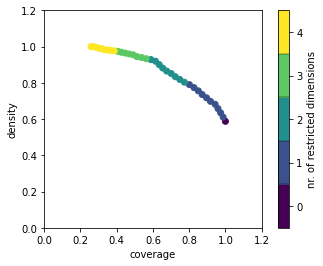

In [68]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

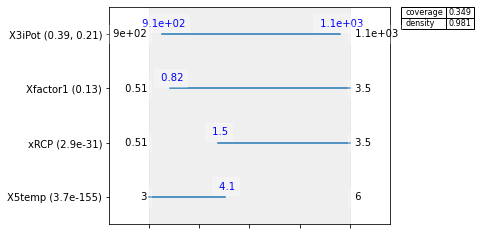

In [70]:
# Saeed : explore the inspect effect
box1.inspect(30, style='graph')
plt.show()

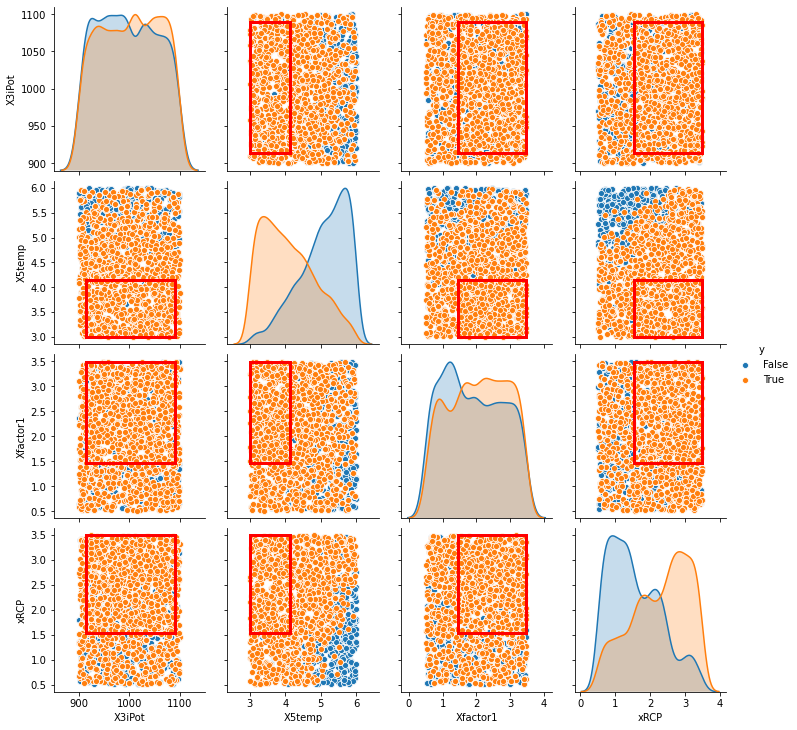

In [71]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(35)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Artifical snow analysis

In [72]:
x = experiments
y = outcomes['y4'] < 60
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 2835 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfac

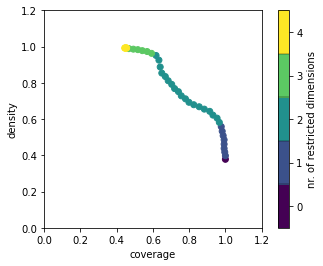

In [73]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

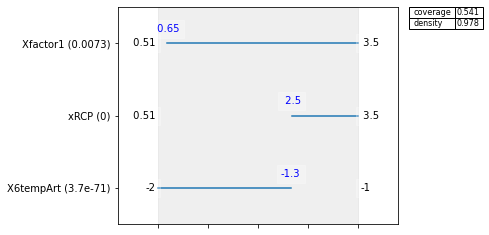

In [75]:
# Saeed : explore the inspect effect
box1.inspect(30, style='graph')
plt.show()

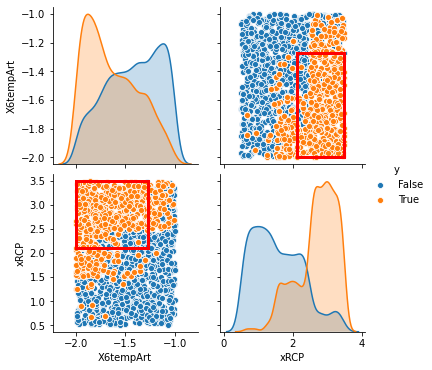

In [77]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial.svg'), format='svg', dpi=600)

### Visualization with ema-workbench - part3

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


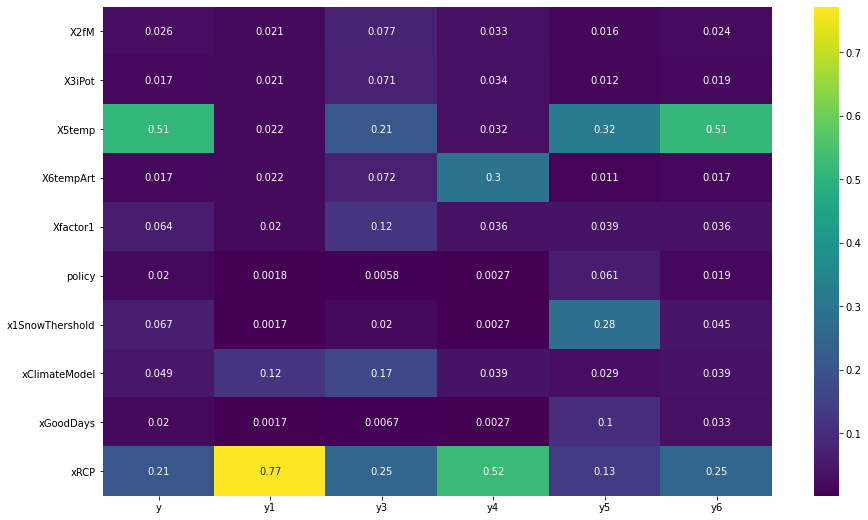

In [78]:
from ema_workbench.analysis import feature_scoring

fig, ax = plt.subplots(figsize=(15,9))

x = experiments
Y = outcomes

fs = feature_scoring.get_feature_scores_all(x, Y)
ax = sns.heatmap(fs, cmap='viridis', annot=True)
plt.show()

fig.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=600)

In [79]:
x = experiments
Y = outcomes['y'] < 70
#fs, alg = feature_scoring.get_ex_feature_scores(x, y, mode=feature_scoring.CLASSIFICATION)
fs, alg = feature_scoring.get_ex_feature_scores(x, Y)

fs.sort_values(ascending=False, by=1)

[MainProcess/INFO] model dropped from analysis because only a single category


,1
0,
X5temp,0.482478
xRCP,0.193537
Xfactor1,0.062763
x1SnowThershold,0.062641
xClimateModel,0.054876
X2fM,0.038409
X3iPot,0.031972
X6tempArt,0.029466
xGoodDays,0.025003


[MainProcess/INFO] model dropped from analysis because only a single category


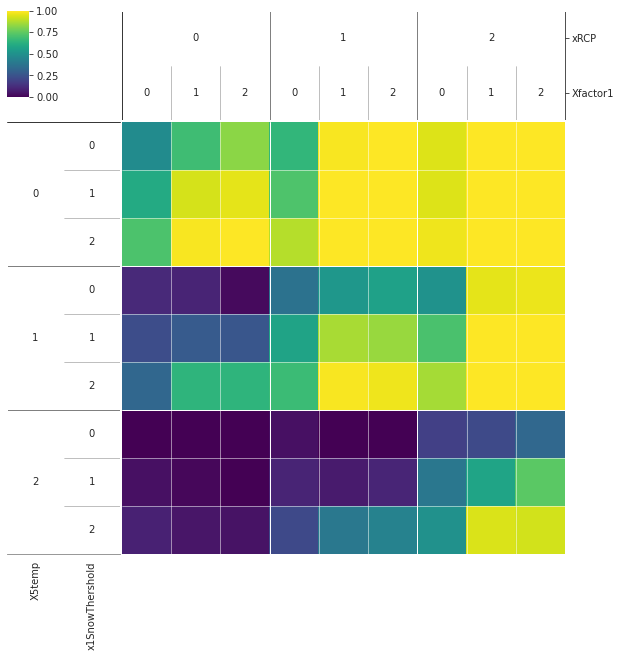

In [81]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


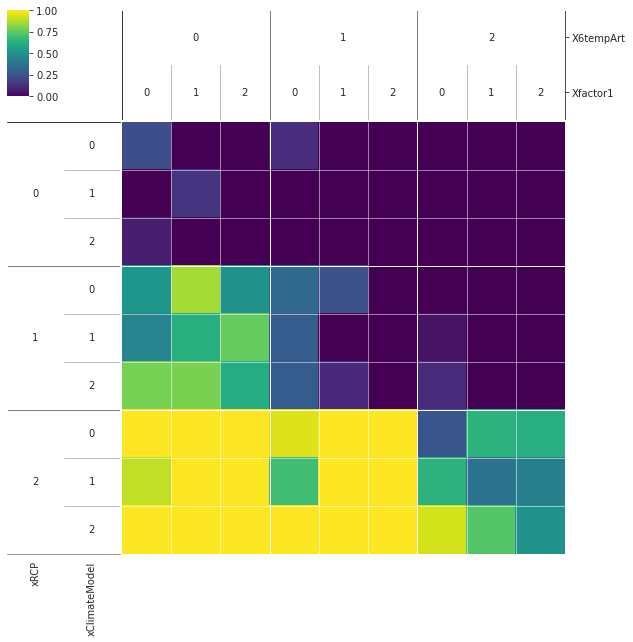

In [82]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y4'] < 60
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


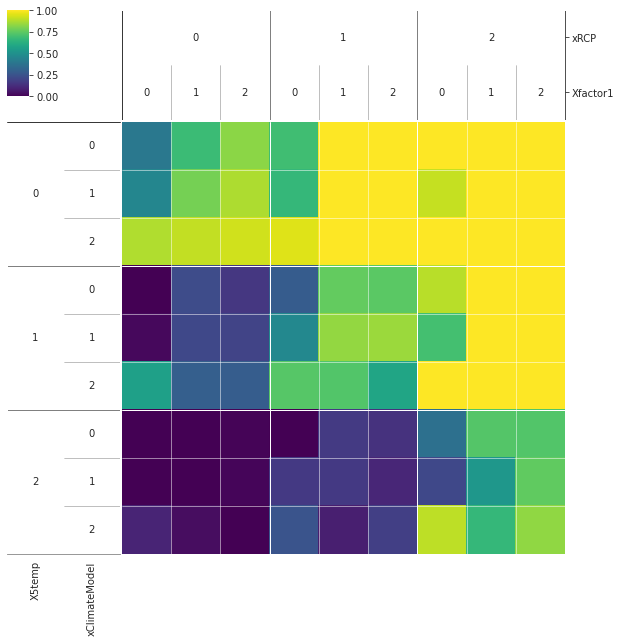

In [83]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y6'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

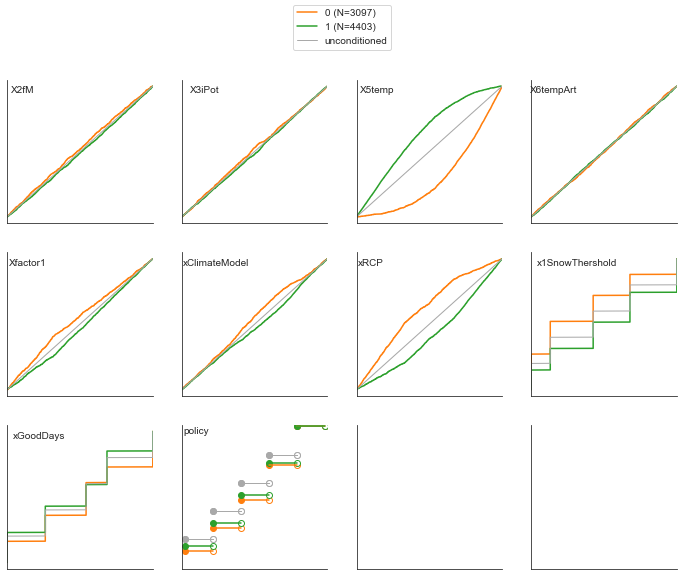

In [85]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y'] < 70
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

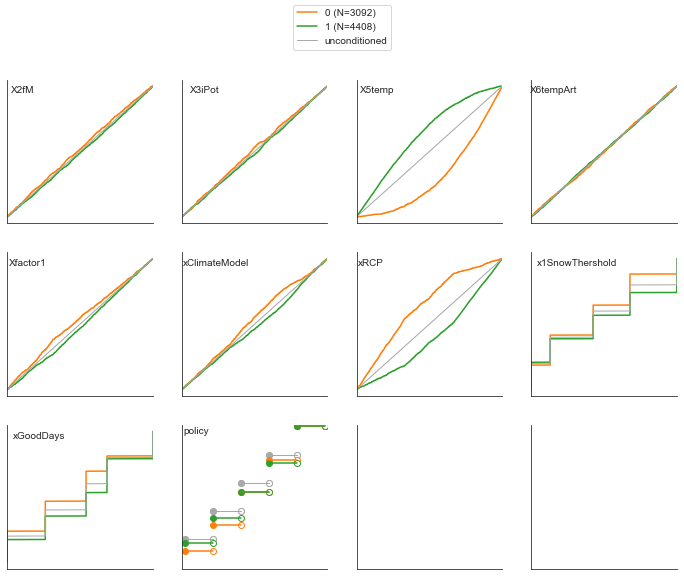

In [86]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y6'] < 0.6
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

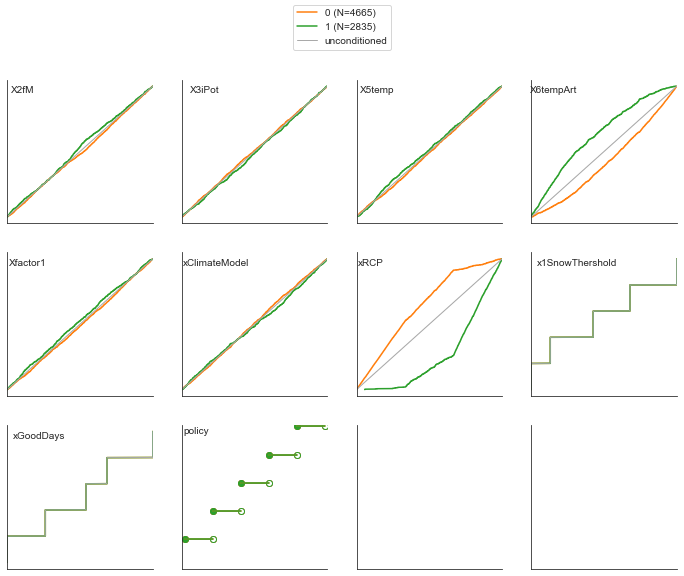

In [87]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y4'] < 60
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

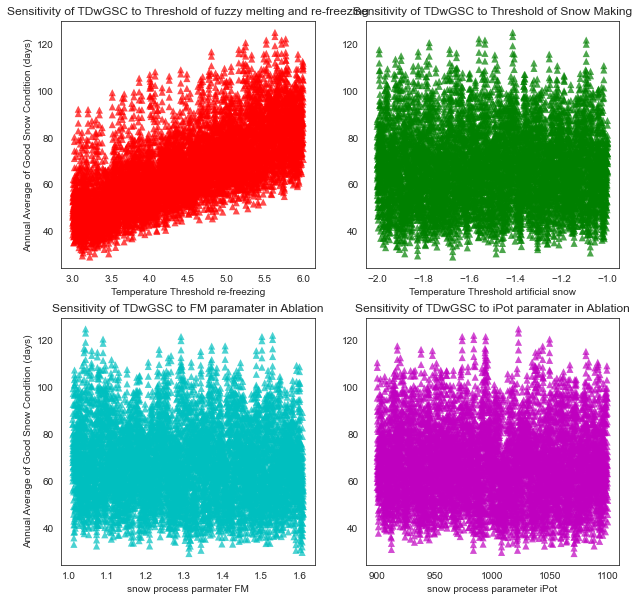

In [88]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing")
axs[0,1].set_xlabel("Temperature Threshold artificial snow")
axs[1,0].set_xlabel("snow process parmater FM")
axs[1,1].set_xlabel("snow process parameter iPot")


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing')
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making')
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation')
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation')


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

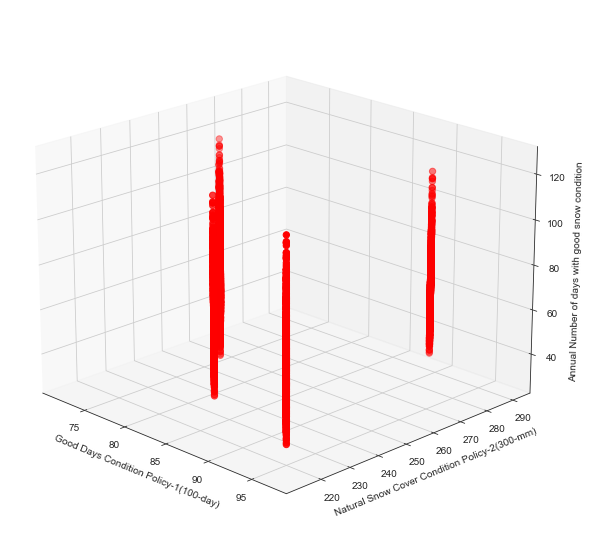

In [89]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)')
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)')
ax.set_zlabel('Annual Number of days with good snow condition')


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

### Defining the Q0.9 and Q0.1 databases

In [90]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

#print(q10_years_Art[0])
#print(q25_years_Art[0])
#print(q50_years_Art[0])
#print(q75_years_Art[0])
#print(q90_years_Art[0])
#print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[28.24443901]
[47.4771677]
[70.86739146]
[94.10783528]
[114.4621592]
(118, 1)
[1.14]
[1.94]
[2.99]
[4.16]
[5.16]
(118, 1)
[34.15795626]
[56.62463303]
[84.72778106]
[100.]
[100.]
(118, 1)


In [91]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
#print(matrix_Art26.shape)
#print(matrix_Art45.shape)
#print(matrix_Art85.shape)
#print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
7500
#########
(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
7500
#########
#########
(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
7500


In [94]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[600, 0, 1:2])
print(matrix_GoodDays[3333].shape)

(7500, 119, 1)
['isOverSnow_sc_Ver1_85_5']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [95]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
#q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
#q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
#q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
#q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

#q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
#q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
#q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
#q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
#q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

#q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
#q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
#q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
#q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
#q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [96]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

#dfq50_fin_26 = pd.DataFrame(q50_years_Art_26)
#dfq50_fin_26.columns = ['median26']
#dfq50_fin_45 = pd.DataFrame(q50_years_Art_45)
#dfq50_fin_45.columns = ['median45']
#dfq50_fin_85 = pd.DataFrame(q50_years_Art_85)
#dfq50_fin_85.columns = ['median85']

#dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
#dfq90_Art_26.columns = ['median26']
#dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
#dfq90_Art_45.columns = ['median45']
#dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
#dfq90_Art_85.columns = ['median85']

#dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
#dfq10_Art_26.columns = ['median26']
#dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
#dfq10_Art_45.columns = ['median45']
#dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
#dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [97]:
dfq50_26.head()

,median26
0,69.992950
1,97.995376
2,113.905735
3,75.356839
4,107.226658


In [98]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

#dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
#dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
#dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [99]:
dfAllAverages.head()

,median26,median45,median85
0,69.992950,71.262527,71.042765
1,97.995376,100.716606,103.559600
2,113.905735,113.155101,110.716106
3,75.356839,77.894000,87.541109
4,107.226658,111.793328,111.582546


In [100]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[28.24443901]
[47.4771677]
[70.86739146]
[94.10783528]
[114.4621592]
(118, 1)
*** RCP2.6***
[31.29401602]
[46.98465685]
[69.99295044]
[94.5456019]
[120.72996789]
(118, 1)
*** RCP4.5***
[26.91003653]
[46.47190143]
[71.26252734]
[95.06785514]
[113.20009521]
(118, 1)
*** RCP8.5***
[25.75952117]
[48.8756522]
[71.04276497]
[92.70310897]
[109.65056038]
(118, 1)


In [101]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[1.14]
[1.94]
[2.99]
[4.16]
[5.16]
(118, 1)
*** RCP2.6***
[1.274]
[1.93]
[2.95]
[4.19]
[5.256]
(118, 1)
*** RCP4.5***
[1.089]
[1.9]
[3.01]
[4.19]
[5.14]
(118, 1)
*** RCP8.5***
[1.064]
[1.98]
[3.01]
[4.08]
[5.06]
(118, 1)


### RCP 2.6 Number of days with Good Snow Condition over the time

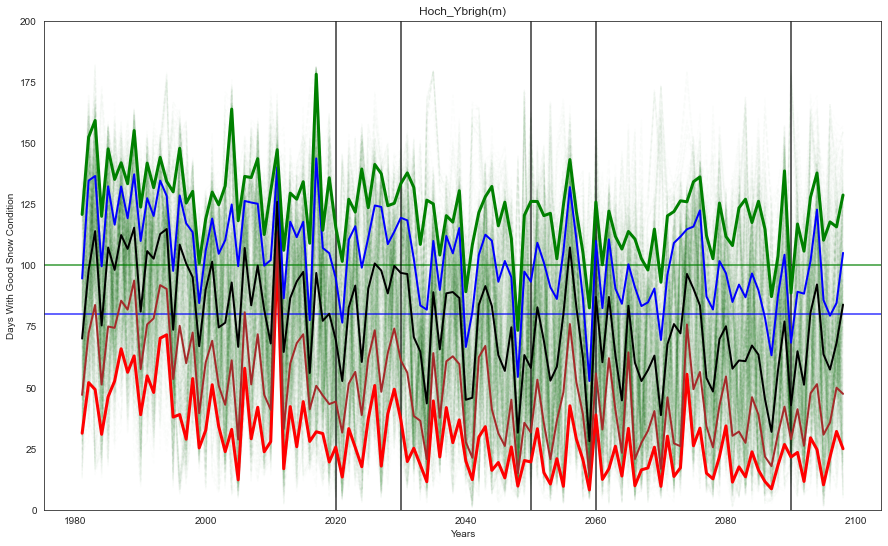

In [105]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), 5):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 3, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 2, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 2, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 2, alpha=1)
plt.plot(x_axis, q90_years_26, color='green', linewidth = 3, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

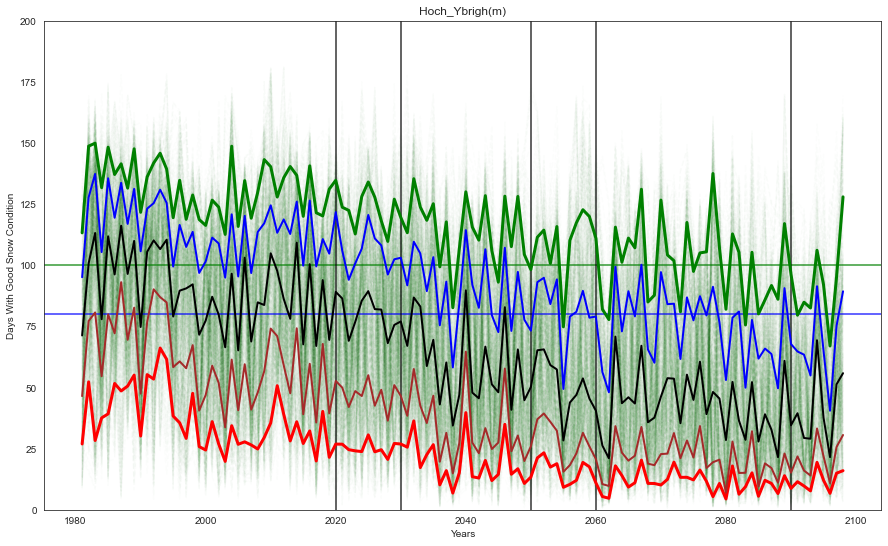

In [106]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), 5):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 3, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 2, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 2, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 2, alpha=1)
plt.plot(x_axis, q90_years_45, color='green', linewidth = 3, alpha=1)


axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

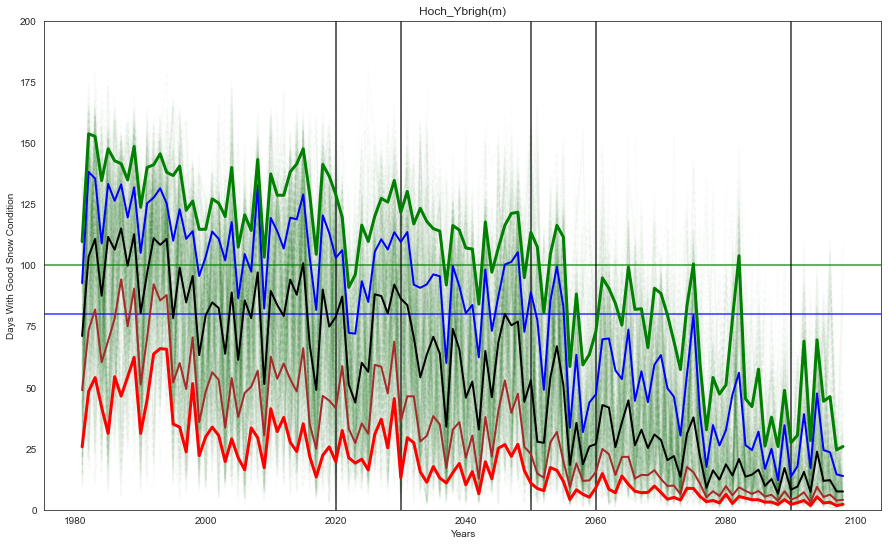

In [107]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), 5):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 3, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 2, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 2, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 2, alpha=1)
plt.plot(x_axis, q90_years_85, color='green', linewidth = 3, alpha=1)


axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

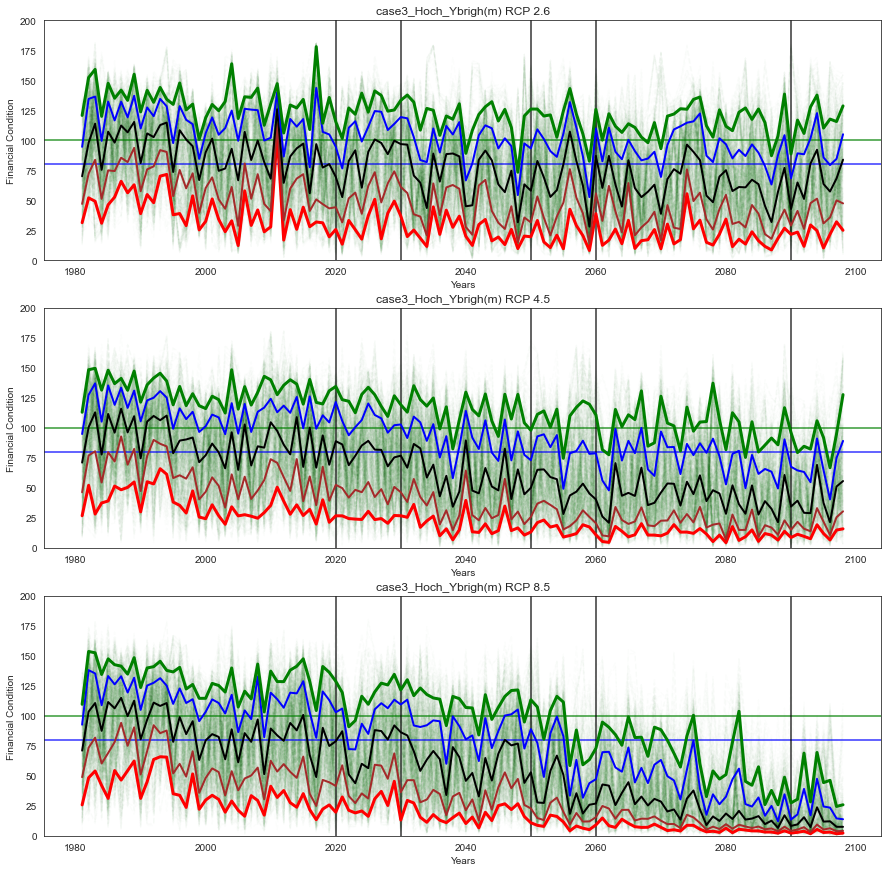

In [109]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays26), 5):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_GoodDays45), 5):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_GoodDays85), 5):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 3, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='brown',linewidth = 2, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='green', linewidth = 3, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 3, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='brown',linewidth = 2, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='green', linewidth = 3, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 3, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='brown',linewidth = 2, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='green', linewidth = 3, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Financial Condition')

axs[1].set_ylim(bottom=0, top =200)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Condition')

axs[2].set_ylim(bottom=0, top =200)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Financial Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
plt.show()

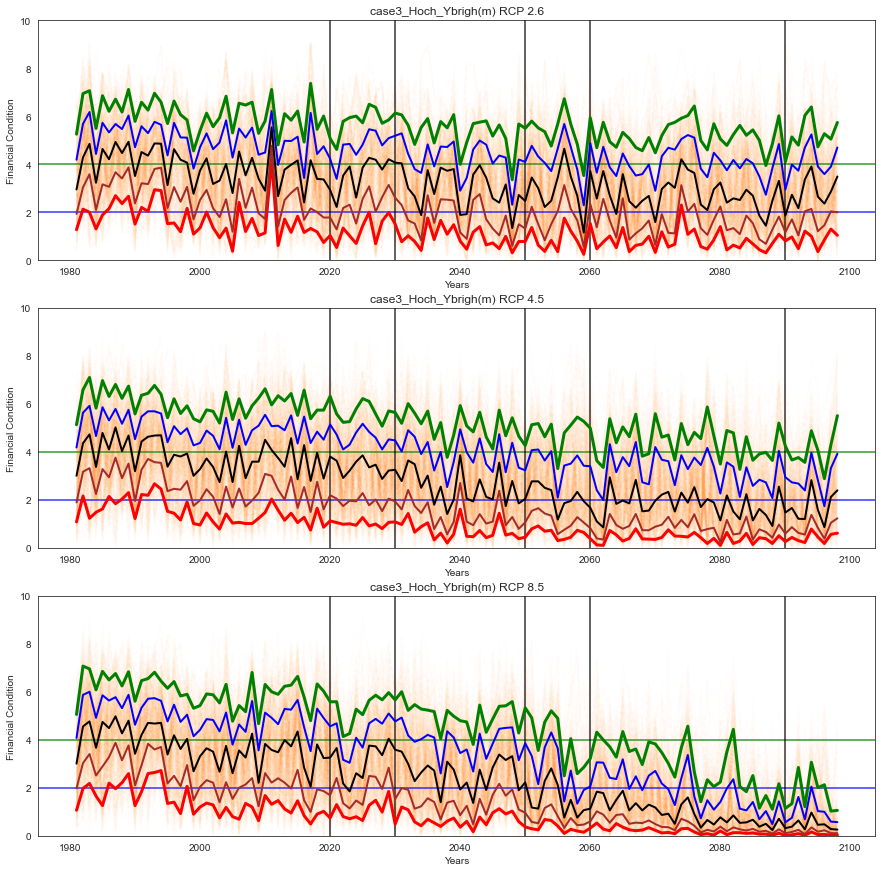

In [110]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_fin26), 5):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_fin45), 5):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_fin85), 5):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=4, color='green', alpha=0.8)
axs[0].axhline(y=2, color='blue', alpha=0.8)
axs[1].axhline(y=4, color='green', alpha=0.8)
axs[1].axhline(y=2, color='blue', alpha=0.8)
axs[2].axhline(y=4, color='green', alpha=0.8)
axs[2].axhline(y=2, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 3, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='brown',linewidth = 2, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='green', linewidth = 3, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 3, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='brown',linewidth = 2, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='green', linewidth = 3, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 3, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='brown',linewidth = 2, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='green', linewidth = 3, alpha=1)

axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Financial Condition')

axs[1].set_ylim(bottom=0, top =10)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Condition')

axs[2].set_ylim(bottom=0, top =10)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Financial Condition')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)

plt.show()

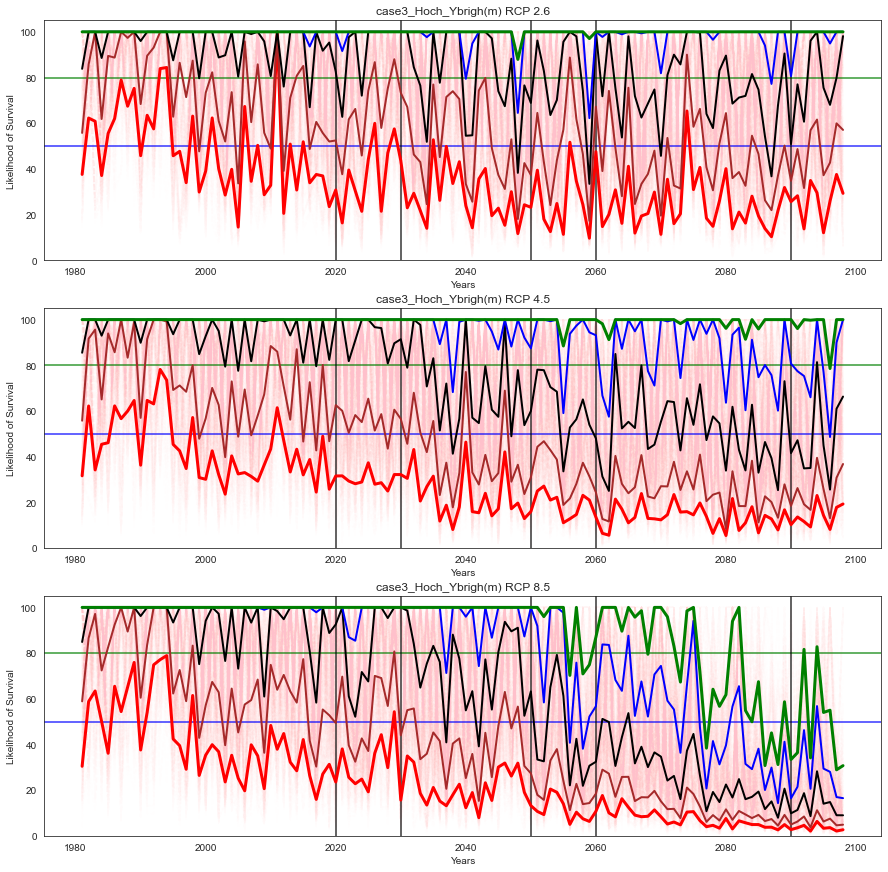

In [111]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), 5):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Like45), 5):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Like85), 5):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 3, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='brown',linewidth = 2, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='green', linewidth = 3, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 3, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='brown',linewidth = 2, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='green', linewidth = 3, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 3, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='brown',linewidth = 2, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='green', linewidth = 3, alpha=1)

axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Likelihood of Survival')

axs[1].set_ylim(bottom=0, top =105)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival')

axs[2].set_ylim(bottom=0, top =105)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Likelihood of Survival')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)

plt.show()

In [112]:
dfAllAverages.head()

,median26,median45,median85
0,69.992950,71.262527,71.042765
1,97.995376,100.716606,103.559600
2,113.905735,113.155101,110.716106
3,75.356839,77.894000,87.541109
4,107.226658,111.793328,111.582546


In [113]:
y_axis = np.arange(1981, 2100, step= 20)

### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

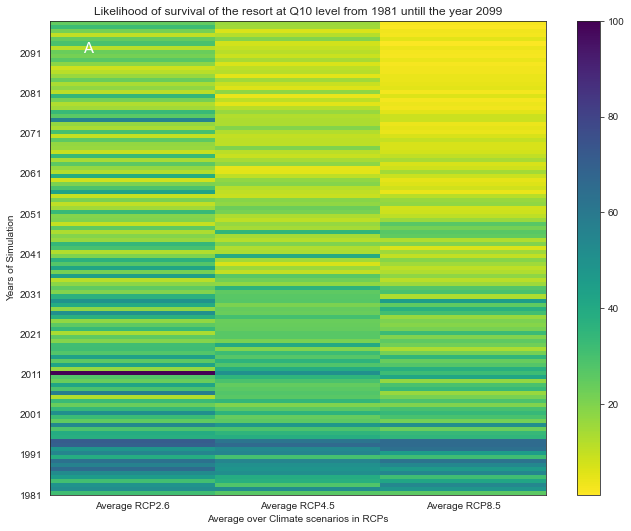

In [114]:
from matplotlib.ticker import FuncFormatter


fig, (ax3) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='viridis_r', vmin=1, vmax=100)
cb3 = fig.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


ax3.set_xlabel("Average over Climate scenarios in RCPs")

ax3.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099))

ax3.text(0.2, 110, 'A', color = 'white', fontsize=15)

fig.savefig(os.path.join(rootVisualization, 'Likelihood_All.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

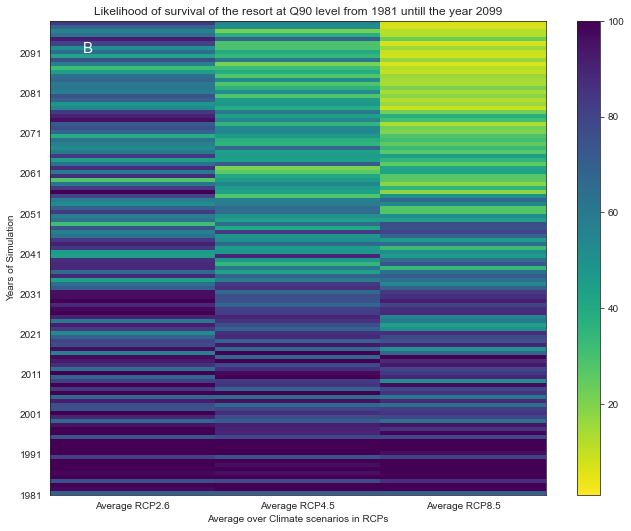

In [115]:
from matplotlib.ticker import FuncFormatter


fig, (ax4) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='viridis_r' ,vmin=1, vmax=100)
cb4 = fig.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


ax4.set_xlabel("Average over Climate scenarios in RCPs")

ax4.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q90 level from {} untill the year {}".format(1981, 2099))

ax4.text(0.2, 110, 'B', color = 'white', fontsize=15)


fig.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

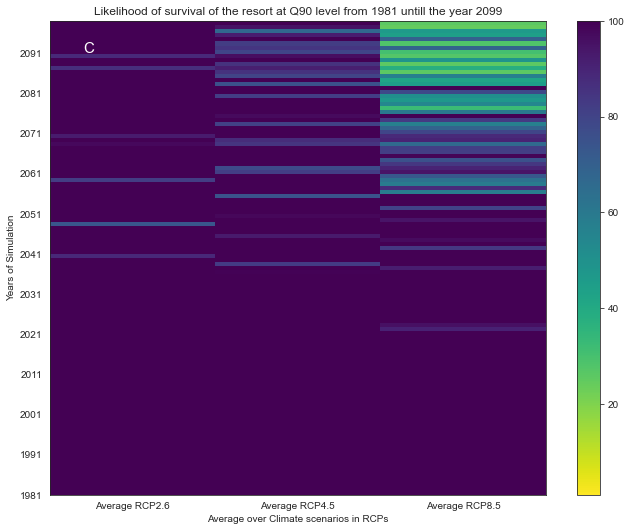

In [116]:
from matplotlib.ticker import FuncFormatter


fig, (ax4) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='viridis_r' ,vmin=1, vmax=100)
cb4 = fig.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


ax4.set_xlabel("Average over Climate scenarios in RCPs")

ax4.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q90 level from {} untill the year {}".format(1981, 2099))

ax4.text(0.2, 110, 'C', color = 'white', fontsize=15)


fig.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [117]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(2495, 119, 2)
(2510, 119, 2)
(2495, 119, 2)
(7500, 119, 2)


In [118]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [119]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [120]:
df26_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver2_26_12'],sc_2_['isOverSnow_sc_Ver1_26_4'],sc_3_['isOverSnow_sc_Ver2_26_3'],sc_4_['isOverSnow_sc_Ver2_26_11'],sc_5_['isOverSnow_sc_Ver2_26_9'],sc_6_['isOverSnow_sc_Ver1_26_2'],sc_7_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_9'],sc_11_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_sc_Ver1_26_9'],sc_13_['isOverSnow_sc_Ver2_26_2'],sc_14_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_15_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_16_['isOverSnow_sc_Ver1_26_10'],sc_17_['isOverSnow_sc_Ver1_26_4'],sc_18_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_Ver2_26_7'],sc_20_['isOverSnow_sc_Ver2_26_7'],sc_21_['isOverSnow_sc_Ver2_26_2'],sc_22_['isOverSnow_sc_Ver2_26_3'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_sc_Ver2_26_7'],sc_25_['isOverSnow_sc_Ver2_26_5'],sc_26_['isOverSnow_sc_Ver1_26_10'],sc_27_['isOverSnow_sc_Ver2_26_3'],sc_28_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_2'],sc_32_['isOverSnow_sc_Ver1_26_5'],sc_33_['isOverSnow_sc_Ver2_26_7'],...,sc_2462_['isOverSnow_sc_Ver1_26_10'],sc_2463_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2464_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2465_['isOverSnow_sc_Ver2_26_8'],sc_2466_['isOverSnow_sc_Ver1_26_6'],sc_2467_['isOverSnow_sc_Ver2_26_9'],sc_2468_['isOverSnow_sc_Ver1_26_5'],sc_2469_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2471_['isOverSnow_sc_Ver1_26_4'],sc_2472_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_sc_Ver2_26_5'],sc_2474_['isOverSnow_sc_Ver2_26_12'],sc_2475_['isOverSnow_sc_Ver2_26_11'],sc_2476_['isOverSnow_sc_Ver1_26_5'],sc_2477_['isOverSnow_sc_Ver1_26_6'],sc_2478_['isOverSnow_sc_Ver1_26_5'],sc_2479_['isOverSnow_sc_Ver1_26_6'],sc_2480_['isOverSnow_sc_Ver2_26_10'],sc_2481_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2482_['isOverSnow_sc_Ver2_26_9'],sc_2483_['isOverSnow_sc_Ver2_26_10'],sc_2484_['isOverSnow_sc_Ver1_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_4'],sc_2486_['isOverSnow_sc_Ver2_26_8'],sc_2487_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2488_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2489_['isOverSnow_sc_Ver1_26_7'],sc_2490_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2492_['isOverSnow_sc_Ver2_26_12'],sc_2493_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_7'],sc_2495_['isOverSnow_sc_Ver2_26_8']
0,1981-1982,68.24151892761644,80.34896508117299,78.64376313092221,132.62882013828843,86.38845990477091,65.48159824355261,107.62435944441364,54.89105755310208,51.216372852102104,118.64952227381345,99.58125842131206,108.87891030835904,84.7023590501532,73.82532508368875,46.15752581029141,105.9787050276708,34.448109771550236,48.56713972583427,77.75581776212888,56.87937061467685,59.61028168224447,102.04648790609342,60.47967495055768,47.92738561464638,69.99295043694987,128.47142886954936,105.30192507047734,58.42381237372158,54.63639632702774,109.32978793560784,61.77972408135357,45.59654784647223,77.8074732737993,...,122.92369032409408,59.71426259785443,115.68168109405148,57.83251972327817,132.18702322308434,69.85549198653764,60.06165372690152,85.11152690713418,46.081627478537165,47.37649766434272,81.26094699465469,57.17113273115582,61.844003897970204,133.69284261342708,85.24391265970301,100.91552400578661,41.16229942892184,106.97336445336236,130.73885536212703,135.09795409736026,30.07600869388334,137.95372990982202,25.110873768750455,30.11962791160329,79.43167008336205,108.10370350969085,51.96999864034464,57.82100103528254,48.93062762220548,114.48579146317547,43.2326066671079,78.59293131308795,72.0947

In [121]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_Ver2_45_12'], dtype='<U47')

In [122]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [123]:
df45_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver1_45_22'],sc_2_['isOverSnow_sc_Ver1_45_3'],sc_3_['isOverSnow_sc_Ver2_45_12'],sc_4_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_5_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_6_['isOverSnow_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_7_['isOverSnow_sc_Ver1_45_1'],sc_8_['isOverSnow_sc_Ver1_45_10'],sc_9_['isOverSnow_sc_Ver1_45_6'],sc_10_['isOverSnow_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_11_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_12_['isOverSnow_sc_Ver2_45_15'],sc_13_['isOverSnow_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_14_['isOverSnow_sc_Ver2_45_17'],sc_15_['isOverSnow_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_16_['isOverSnow_sc_Ver1_45_12'],sc_17_['isOverSnow_sc_Ver1_45_15'],sc_18_['isOverSnow_sc_Ver1_45_6'],sc_19_['isOverSnow_sc_Ver2_45_22'],sc_20_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_21_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_22_['isOverSnow_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_23_['isOverSnow_sc_Ver2_45_9'],sc_24_['isOverSnow_sc_Ver1_45_9'],sc_25_['isOverSnow_sc_Ver1_45_14'],sc_26_['isOverSnow_sc_Ver2_45_17'],sc_27_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_28_['isOverSnow_sc_Ver2_45_11'],sc_29_['isOverSnow_sc_Ver2_45_23'],sc_30_['isOverSnow_sc_Ver2_45_10'],sc_31_['isOverSnow_sc_Ver1_45_13'],sc_32_['isOverSnow_sc_Ver1_45_12'],sc_33_['isOverSnow_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],...,sc_2477_['isOverSnow_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2478_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2479_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2480_['isOverSnow_sc_Ver1_45_5'],sc_2481_['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2482_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_2483_['isOverSnow_sc_Ver1_45_19'],sc_2484_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_2485_['isOverSnow_sc_Ver2_45_23'],sc_2486_['isOverSnow_sc_Ver1_45_25'],sc_2487_['isOverSnow_sc_Ver2_45_16'],sc_2488_['isOverSnow_sc_Ver1_45_19'],sc_2489_['isOverSnow_sc_Ver1_45_21'],sc_2490_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2491_['isOverSnow_sc_Ver1_45_22'],sc_2492_['isOverSnow_sc_Ver1_45_7'],sc_2493_['isOverSnow_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_2494_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2495_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2496_['isOverSnow_sc_Ver2_45_3'],sc_2497_['isOverSnow_sc_Ver1_45_20'],sc_2498_['isOverSnow_sc_Ver1_45_15'],sc_2499_['isOverSnow_sc_Ver1_45_24'],sc_2500_['isOverSnow_sc_Ver1_45_18'],sc_2501_['isOverSnow_sc_Ver2_45_11'],sc_2502_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_2503_['isOverSnow_sc_Ver2_45_21'],sc_2504_['isOverSnow_sc_Ver2_45_15'],sc_2505_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2506_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2507_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2508_['isOverSnow_sc_Ver2_45_4'],sc_2509_['isOverSnow_sc_Ver2_45_11'],sc_2510_['isOverSnow_sc_Ver1_45_24']
0,1981-1982,83.80118871185837,14.43572876143265,91.5799256600985,72.82851211128997,64.9772315060066,46.08010951190208,98.36263069476438,60.882695092172874,93.81962051854232,108.1247551871914,50.29898525158029,100.24729542771277,60.7867953176975,76.32908042058594,98.585708982413,77.77222374143969,57.07246489987523,114.78950157232657,65.79371897137266,81.90304336963358,53.08829358962781,67.47370622171509,34.363192932140436,96.30756743123462,124.38099658429005,87.00828470929406,41.04041563733995,93.63858418593192,19.62454053485315,18.850422197036938,112.53138855163519,94.86958258871678,55.50413748936671,...,112.03932737759449,78.35279430995784,72.44808288489097,56.627298659991034,25.698326856528645,117.58343965910478,85.59878737477861,76.19884430084866,57.19390223068217,31.648086374902096,68.3366218949149,86.90517624857988,14.353713917060514,85.85264808090716,99.12191910931185,87.03320384165197,98.79058983207204,57.58678771270433,57.67290999620664,49.12640067205407,113.50796691925802,98.16149620173994,50.05044053812372,34.6247296541502,90.47265187195359,47.855639368099

In [124]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [125]:
df85_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver2_85_22'],sc_2_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_3_['isOverSnow_sc_Ver1_85_16'],sc_4_['isOverSnow_sc_Ver1_85_4'],sc_5_['isOverSnow_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_6_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_7_['isOverSnow_sc_Ver1_85_10'],sc_8_['isOverSnow_sc_Ver1_85_25'],sc_9_['isOverSnow_sc_Ver1_85_9'],sc_10_['isOverSnow_sc_Ver1_85_30'],sc_11_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_12_['isOverSnow_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_13_['isOverSnow_sc_Ver1_85_17'],sc_14_['isOverSnow_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_15_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_16_['isOverSnow_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_17_['isOverSnow_sc_Ver1_85_5'],sc_18_['isOverSnow_sc_Ver2_85_15'],sc_19_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_20_['isOverSnow_sc_Ver2_85_20'],sc_21_['isOverSnow_sc_Ver1_85_10'],sc_22_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_23_['isOverSnow_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_24_['isOverSnow_sc_Ver2_85_7'],sc_25_['isOverSnow_sc_Ver1_85_13'],sc_26_['isOverSnow_sc_Ver2_85_12'],sc_27_['isOverSnow_sc_Ver2_85_7'],sc_28_['isOverSnow_sc_Ver1_85_5'],sc_29_['isOverSnow_sc_Ver2_85_17'],sc_30_['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_31_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_32_['isOverSnow_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_33_['isOverSnow_sc_Ver2_85_13'],...,sc_2462_['isOverSnow_sc_Ver2_85_14'],sc_2463_['isOverSnow_sc_Ver2_85_12'],sc_2464_['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_2465_['isOverSnow_sc_Ver1_85_30'],sc_2466_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2467_['isOverSnow_sc_Ver1_85_31'],sc_2468_['isOverSnow_sc_Ver2_85_17'],sc_2469_['isOverSnow_sc_Ver2_85_26'],sc_2470_['isOverSnow_sc_Ver2_85_14'],sc_2471_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2472_['isOverSnow_sc_Ver1_85_14'],sc_2473_['isOverSnow_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_2474_['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_2475_['isOverSnow_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2476_['isOverSnow_sc_Ver1_85_6'],sc_2477_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2478_['isOverSnow_sc_Ver1_85_29'],sc_2479_['isOverSnow_sc_Ver1_85_22'],sc_2480_['isOverSnow_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_2481_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2482_['isOverSnow_sc_Ver1_85_21'],sc_2483_['isOverSnow_sc_Ver1_85_20'],sc_2484_['isOverSnow_sc_Ver2_85_29'],sc_2485_['isOverSnow_sc_Ver2_85_27'],sc_2486_['isOverSnow_sc_Ver1_85_4'],sc_2487_['isOverSnow_sc_Ver1_85_8'],sc_2488_['isOverSnow_sc_Ver2_85_1'],sc_2489_['isOverSnow_sc_Ver1_85_12'],sc_2490_['isOverSnow_sc_Ver2_85_28'],sc_2491_['isOverSnow_sc_Ver1_85_22'],sc_2492_['isOverSnow_sc_Ver1_85_27'],sc_2493_['isOverSnow_sc_Ver1_85_23'],sc_2494_['isOverSnow_sc_Ver1_85_5'],sc_2495_['isOverSnow_sc_Ver2_85_30']
0,1981-1982,135.89462181376445,89.29880686837683,108.14362723575192,66.54609466944518,98.49873882565123,88.63291062242673,107.79551805669585,89.66247686072042,89.09188223081992,99.39931883327124,136.30474439447153,138.09471540035688,124.11762234977805,51.41031541277303,63.401894661330125,102.7884540447832,111.12168534393727,20.11229893156819,87.10762203063061,30.892853327869442,86.21475836888074,91.16147553397909,30.435766786398652,68.30858787101225,64.40303830324667,123.76012385001023,83.74471824603582,93.18605836658446,10.648535945126296,79.84455369754959,97.331442748818,109.09244507151577,25.822934058838175,...,96.66682428412355,133.0482010098173,59.92834385003476,90.15813390038451,51.57447903974981,122.63738536295087,16.40765671256399,90.19630669886229,99.46019541522381,119.73074382267093,21.02562373903727,97.85454057336734,76.42263793127032,99.30209994201843,39.708355268974735,42.68776660502793,31.18555301197597,37.66119867725165,27.847321151034976,51.41058659979379,103.18427543182693,16.154959913899727,100.48919469783954,70.09367198779555,39.885555550582225,105.18006174554974,66.83608789781604,79.68445968584372,52.76237722385934,

In [126]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

### Survival Map CH2018 RCP2.6

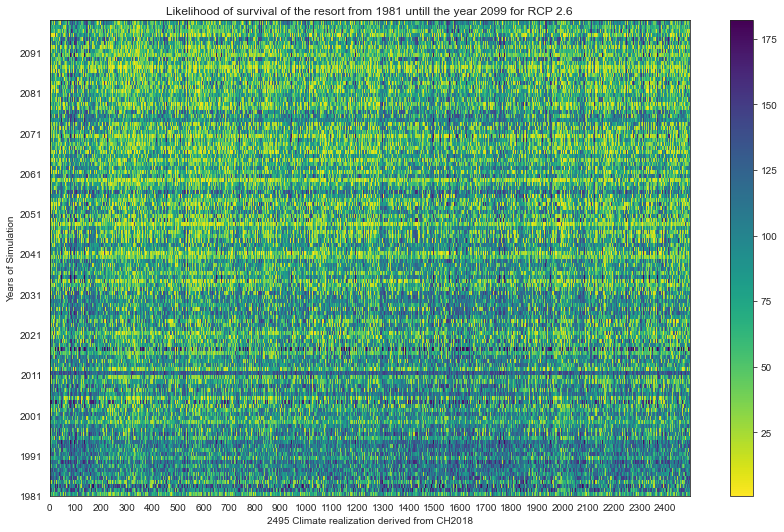

In [127]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='viridis_r')
cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6))

fig.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

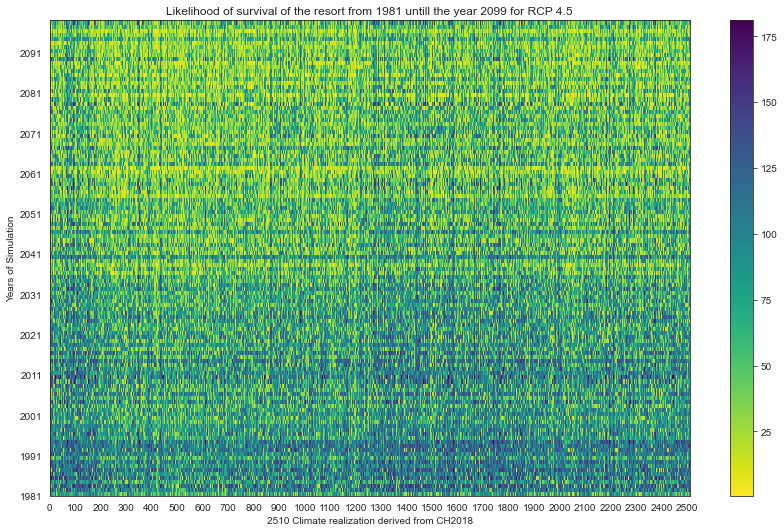

In [128]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='viridis_r')
cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5))

fig.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

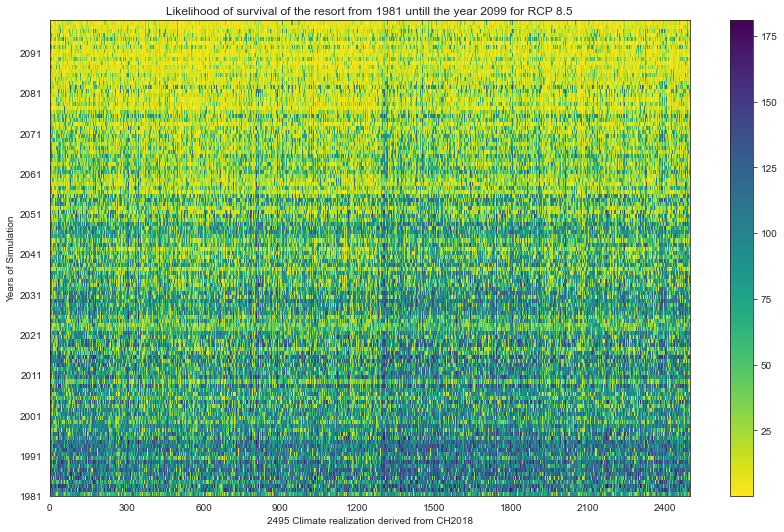

In [129]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='viridis_r')

cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5))

fig.tight_layout()
plt.show()

## 3 years of not having good snow days

In [130]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

In [131]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver2_26_12'],sc_2_['isOverSnow_sc_Ver1_26_4'],sc_3_['isOverSnow_sc_Ver2_26_3'],sc_4_['isOverSnow_sc_Ver2_26_11'],sc_5_['isOverSnow_sc_Ver2_26_9'],sc_6_['isOverSnow_sc_Ver1_26_2'],sc_7_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_9'],sc_11_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_sc_Ver1_26_9'],sc_13_['isOverSnow_sc_Ver2_26_2'],sc_14_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_15_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_16_['isOverSnow_sc_Ver1_26_10'],sc_17_['isOverSnow_sc_Ver1_26_4'],sc_18_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_Ver2_26_7'],sc_20_['isOverSnow_sc_Ver2_26_7'],sc_21_['isOverSnow_sc_Ver2_26_2'],sc_22_['isOverSnow_sc_Ver2_26_3'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_sc_Ver2_26_7'],sc_25_['isOverSnow_sc_Ver2_26_5'],sc_26_['isOverSnow_sc_Ver1_26_10'],sc_27_['isOverSnow_sc_Ver2_26_3'],sc_28_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_2'],sc_32_['isOverSnow_sc_Ver1_26_5'],sc_33_['isOverSnow_sc_Ver2_26_7'],...,sc_2462_['isOverSnow_sc_Ver1_26_10'],sc_2463_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2464_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2465_['isOverSnow_sc_Ver2_26_8'],sc_2466_['isOverSnow_sc_Ver1_26_6'],sc_2467_['isOverSnow_sc_Ver2_26_9'],sc_2468_['isOverSnow_sc_Ver1_26_5'],sc_2469_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2471_['isOverSnow_sc_Ver1_26_4'],sc_2472_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_sc_Ver2_26_5'],sc_2474_['isOverSnow_sc_Ver2_26_12'],sc_2475_['isOverSnow_sc_Ver2_26_11'],sc_2476_['isOverSnow_sc_Ver1_26_5'],sc_2477_['isOverSnow_sc_Ver1_26_6'],sc_2478_['isOverSnow_sc_Ver1_26_5'],sc_2479_['isOverSnow_sc_Ver1_26_6'],sc_2480_['isOverSnow_sc_Ver2_26_10'],sc_2481_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2482_['isOverSnow_sc_Ver2_26_9'],sc_2483_['isOverSnow_sc_Ver2_26_10'],sc_2484_['isOverSnow_sc_Ver1_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_4'],sc_2486_['isOverSnow_sc_Ver2_26_8'],sc_2487_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2488_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2489_['isOverSnow_sc_Ver1_26_7'],sc_2490_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2492_['isOverSnow_sc_Ver2_26_12'],sc_2493_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_7'],sc_2495_['isOverSnow_sc_Ver2_26_8']
0,1981-1982,68.24151892761644,80.34896508117299,78.64376313092221,132.62882013828843,86.38845990477091,65.48159824355261,107.62435944441364,54.89105755310208,51.216372852102104,118.64952227381345,99.58125842131206,108.87891030835904,84.7023590501532,73.82532508368875,46.15752581029141,105.9787050276708,34.448109771550236,48.56713972583427,77.75581776212888,56.87937061467685,59.61028168224447,102.04648790609342,60.47967495055768,47.92738561464638,69.99295043694987,128.47142886954936,105.30192507047734,58.42381237372158,54.63639632702774,109.32978793560784,61.77972408135357,45.59654784647223,77.8074732737993,...,122.92369032409408,59.71426259785443,115.68168109405148,57.83251972327817,132.18702322308434,69.85549198653764,60.06165372690152,85.11152690713418,46.081627478537165,47.37649766434272,81.26094699465469,57.17113273115582,61.844003897970204,133.69284261342708,85.24391265970301,100.91552400578661,41.16229942892184,106.97336445336236,130.73885536212703,135.09795409736026,30.07600869388334,137.95372990982202,25.110873768750455,30.11962791160329,79.43167008336205,108.10370350969085,51.96999864034464,57.82100103528254,48.93062762220548,114.48579146317547,43.2326066671079,78.59293131308795,72.0947

In [132]:
type(df26_all)

pandas.core.frame.DataFrame

In [133]:
df26_allColumns = df26_all.columns

In [134]:
df26_all[df26_allColumns[1]].iloc[0]

'68.24151892761644'

In [135]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver2_26_12'],sc_2_['isOverSnow_sc_Ver1_26_4'],sc_3_['isOverSnow_sc_Ver2_26_3'],sc_4_['isOverSnow_sc_Ver2_26_11'],sc_5_['isOverSnow_sc_Ver2_26_9'],sc_6_['isOverSnow_sc_Ver1_26_2'],sc_7_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_9'],sc_11_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_sc_Ver1_26_9'],sc_13_['isOverSnow_sc_Ver2_26_2'],sc_14_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_15_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_16_['isOverSnow_sc_Ver1_26_10'],sc_17_['isOverSnow_sc_Ver1_26_4'],sc_18_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_Ver2_26_7'],sc_20_['isOverSnow_sc_Ver2_26_7'],sc_21_['isOverSnow_sc_Ver2_26_2'],sc_22_['isOverSnow_sc_Ver2_26_3'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_sc_Ver2_26_7'],sc_25_['isOverSnow_sc_Ver2_26_5'],sc_26_['isOverSnow_sc_Ver1_26_10'],sc_27_['isOverSnow_sc_Ver2_26_3'],sc_28_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_2'],sc_32_['isOverSnow_sc_Ver1_26_5'],sc_33_['isOverSnow_sc_Ver2_26_7'],...,sc_2462_['isOverSnow_sc_Ver1_26_10'],sc_2463_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2464_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2465_['isOverSnow_sc_Ver2_26_8'],sc_2466_['isOverSnow_sc_Ver1_26_6'],sc_2467_['isOverSnow_sc_Ver2_26_9'],sc_2468_['isOverSnow_sc_Ver1_26_5'],sc_2469_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2471_['isOverSnow_sc_Ver1_26_4'],sc_2472_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_sc_Ver2_26_5'],sc_2474_['isOverSnow_sc_Ver2_26_12'],sc_2475_['isOverSnow_sc_Ver2_26_11'],sc_2476_['isOverSnow_sc_Ver1_26_5'],sc_2477_['isOverSnow_sc_Ver1_26_6'],sc_2478_['isOverSnow_sc_Ver1_26_5'],sc_2479_['isOverSnow_sc_Ver1_26_6'],sc_2480_['isOverSnow_sc_Ver2_26_10'],sc_2481_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2482_['isOverSnow_sc_Ver2_26_9'],sc_2483_['isOverSnow_sc_Ver2_26_10'],sc_2484_['isOverSnow_sc_Ver1_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_4'],sc_2486_['isOverSnow_sc_Ver2_26_8'],sc_2487_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2488_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2489_['isOverSnow_sc_Ver1_26_7'],sc_2490_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2492_['isOverSnow_sc_Ver2_26_12'],sc_2493_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_7'],sc_2495_['isOverSnow_sc_Ver2_26_8']
0,1981-1982,68.24151892761644,80.34896508117299,78.64376313092221,132.62882013828843,86.38845990477091,65.48159824355261,107.62435944441364,54.89105755310208,51.216372852102104,118.64952227381345,99.58125842131206,108.87891030835904,84.7023590501532,73.82532508368875,46.15752581029141,105.9787050276708,34.448109771550236,48.56713972583427,77.75581776212888,56.87937061467685,59.61028168224447,102.04648790609342,60.47967495055768,47.92738561464638,69.99295043694987,128.47142886954936,105.30192507047734,58.42381237372158,54.63639632702774,109.32978793560784,61.77972408135357,45.59654784647223,77.8074732737993,...,122.92369032409408,59.71426259785443,115.68168109405148,57.83251972327817,132.18702322308434,69.85549198653764,60.06165372690152,85.11152690713418,46.081627478537165,47.37649766434272,81.26094699465469,57.17113273115582,61.844003897970204,133.69284261342708,85.24391265970301,100.91552400578661,41.16229942892184,106.97336445336236,130.73885536212703,135.09795409736026,30.07600869388334,137.95372990982202,25.110873768750455,30.11962791160329,79.43167008336205,108.10370350969085,51.96999864034464,57.82100103528254,48.93062762220548,114.48579146317547,43.2326066671079,78.59293131308795,72.0947

In [136]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [137]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver2_26_12'],sc_2_['isOverSnow_sc_Ver1_26_4'],sc_3_['isOverSnow_sc_Ver2_26_3'],sc_4_['isOverSnow_sc_Ver2_26_11'],sc_5_['isOverSnow_sc_Ver2_26_9'],sc_6_['isOverSnow_sc_Ver1_26_2'],sc_7_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_9'],sc_11_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_sc_Ver1_26_9'],sc_13_['isOverSnow_sc_Ver2_26_2'],sc_14_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_15_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_16_['isOverSnow_sc_Ver1_26_10'],sc_17_['isOverSnow_sc_Ver1_26_4'],sc_18_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_Ver2_26_7'],sc_20_['isOverSnow_sc_Ver2_26_7'],sc_21_['isOverSnow_sc_Ver2_26_2'],sc_22_['isOverSnow_sc_Ver2_26_3'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_sc_Ver2_26_7'],sc_25_['isOverSnow_sc_Ver2_26_5'],sc_26_['isOverSnow_sc_Ver1_26_10'],sc_27_['isOverSnow_sc_Ver2_26_3'],sc_28_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_2'],sc_32_['isOverSnow_sc_Ver1_26_5'],sc_33_['isOverSnow_sc_Ver2_26_7'],...,sc_2462_['isOverSnow_sc_Ver1_26_10'],sc_2463_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2464_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2465_['isOverSnow_sc_Ver2_26_8'],sc_2466_['isOverSnow_sc_Ver1_26_6'],sc_2467_['isOverSnow_sc_Ver2_26_9'],sc_2468_['isOverSnow_sc_Ver1_26_5'],sc_2469_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2471_['isOverSnow_sc_Ver1_26_4'],sc_2472_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_sc_Ver2_26_5'],sc_2474_['isOverSnow_sc_Ver2_26_12'],sc_2475_['isOverSnow_sc_Ver2_26_11'],sc_2476_['isOverSnow_sc_Ver1_26_5'],sc_2477_['isOverSnow_sc_Ver1_26_6'],sc_2478_['isOverSnow_sc_Ver1_26_5'],sc_2479_['isOverSnow_sc_Ver1_26_6'],sc_2480_['isOverSnow_sc_Ver2_26_10'],sc_2481_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2482_['isOverSnow_sc_Ver2_26_9'],sc_2483_['isOverSnow_sc_Ver2_26_10'],sc_2484_['isOverSnow_sc_Ver1_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_4'],sc_2486_['isOverSnow_sc_Ver2_26_8'],sc_2487_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2488_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2489_['isOverSnow_sc_Ver1_26_7'],sc_2490_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2492_['isOverSnow_sc_Ver2_26_12'],sc_2493_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_7'],sc_2495_['isOverSnow_sc_Ver2_26_8']
0,1981-1982,68.24151892761644,80.34896508117299,78.64376313092221,132.62882013828843,86.38845990477091,65.48159824355261,107.62435944441364,54.89105755310208,51.216372852102104,118.64952227381345,99.58125842131206,108.87891030835904,84.7023590501532,73.82532508368875,46.15752581029141,105.9787050276708,34.448109771550236,48.56713972583427,77.75581776212888,56.87937061467685,59.61028168224447,102.04648790609342,60.47967495055768,47.92738561464638,69.99295043694987,128.47142886954936,105.30192507047734,58.42381237372158,54.63639632702774,109.32978793560784,61.77972408135357,45.59654784647223,77.8074732737993,...,122.92369032409408,59.71426259785443,115.68168109405148,57.83251972327817,132.18702322308434,69.85549198653764,60.06165372690152,85.11152690713418,46.081627478537165,47.37649766434272,81.26094699465469,57.17113273115582,61.844003897970204,133.69284261342708,85.24391265970301,100.91552400578661,41.16229942892184,106.97336445336236,130.73885536212703,135.09795409736026,30.07600869388334,137.95372990982202,25.110873768750455,30.11962791160329,79.43167008336205,108.10370350969085,51.96999864034464,57.82100103528254,48.93062762220548,114.48579146317547,43.2326066671079,78.59293131308795,72.0947

In [138]:
print(len(T1RCP26[:]))
print(len(T1RCP45[:]))
print(len(T1RCP85[:]))

2496
2511
2496


In [139]:
type(T1RCP85)

numpy.ndarray

In [140]:
x_axis = np.arange(1,7504)

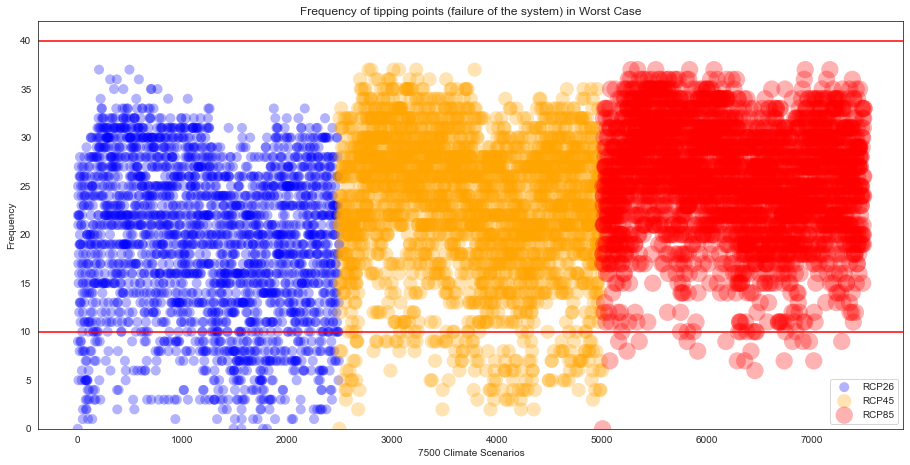

In [141]:
fig, ax1 = plt.subplots(figsize=(15.5,7.5))

ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 2)],T1RCP26[:], s = 100, c='b' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 2: len(matrix_GoodDays26) + len(matrix_GoodDays45) + 3],T1RCP45[:], s = 200, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 3:7504],T1RCP85[:-1], s = 300, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points (failure of the system) in Worst Case")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("7500 Climate Scenarios")
ax1.set_ylim(bottom=0, top =42)
ax1.axhline(y=10, color='red')
ax1.axhline(y=40, color='red')

ax1.legend()


fig.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [142]:
from scipy.integrate import simps
#from numpy import trapz
#from decimal import Decimal, ROUND_DOWN, ROUND_UP

In [143]:
def area_max_min_df (df, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario, dx=1)
    areamin1 = trapz(min_scenario, dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario, dx=1)
    areamin2 = simps(min_scenario, dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [144]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [145]:
max_scenario.to_numpy()

array([99.99671035, 99.99988481, 99.9898666 , 99.92893464, 99.98690897,
       99.98304398, 99.95494499, 99.91976445, 99.99882529, 99.90766941,
       99.98586515, 99.98918639, 99.99923385, 99.97120526, 99.97721456,
       99.99583839, 99.98767102, 99.99747697, 99.82976511, 99.99933068,
       99.99459948, 99.95230866, 99.99107195, 99.92496294, 99.91624952,
       99.88613502, 99.96086805, 99.99701406, 99.98990954, 99.99194384,
       99.92499819, 99.98366425, 99.92296927, 99.9920536 , 99.9986848 ,
       99.6203721 , 99.95862897, 99.97508186, 99.9565705 , 99.97070171,
       99.95436608, 99.97431773, 99.99621602, 99.89756746, 99.92657791,
       99.93566592, 99.99365712, 99.95749417, 99.92787343, 99.98700791,
       99.99059512, 99.9819053 , 99.96542277, 99.85932218, 99.97810538,
       99.99060909, 99.86707273, 99.97526554, 99.9825265 , 99.97776728,
       99.97811986, 99.95126402, 99.99684257, 99.86489958, 99.9800122 ,
       99.9511098 , 99.84773297, 99.85858152, 99.95380681, 99.98

In [146]:
min_scenario.to_numpy()

array([ 10.43057357, 100.16484404, 100.06834092, 100.03442935,
       100.06668459, 100.00697282, 100.0008559 , 100.00480415,
       100.13198605,  10.04907093, 100.02380512, 100.00009341,
       100.02266842, 100.04939993,  10.19684423,  10.02794321,
        10.4766039 , 100.0602846 ,  10.33311141,  10.08789596,
       100.01261352,  10.08885272,  10.25257333,  10.00487724,
        10.0310755 , 100.06554145,  10.10885505,  10.71933553,
        10.62317912, 100.07323052, 100.08212188,  10.06565979,
       100.00254189,  10.13697106,  10.08282938, 100.32208483,
        10.32114626,  10.04805767,  10.01541343,  10.03932946,
        10.11358775,  10.15090343,  10.24475109,  10.56871617,
       100.01592872, 100.06543318,  10.00344477,  10.24880769,
       100.02154872, 100.01740576,  10.0274143 ,  10.1128559 ,
        10.11139899,  10.04864462,  10.25018205,  10.62492141,
       100.030203  ,  10.10006575, 100.11722973,  10.0956439 ,
         0.95803146,  10.03593441,  10.26398237,  10.00

In [147]:
max_scenario.shape

(118,)

In [148]:
print("Resort3 Worst Case")
area_max_min_df (df26_all, 118)
area_max_min_df (df45_all, 118)
area_max_min_df (df85_all, 118)

Resort3 Worst Case
Start************************************************************
Uncertainty Band1 =65.47 days
Uncertainty Band2 =65.50 days
****************************************End

Start************************************************************
Uncertainty Band1 =58.37 days
Uncertainty Band2 =58.40 days
****************************************End

Start************************************************************
Uncertainty Band1 =54.87 days
Uncertainty Band2 =54.87 days
****************************************End



## End